# UTKFaceで変分オートエンコーダ 再学習

再学習版

参考文献
- https://github.com/pytorch/examples/blob/master/vae/main.py

In [1]:
%matplotlib inline

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
import glob
from PIL import Image
import random

import torch
import torch.nn as nn
from torch.nn import functional as F
import torch.optim as optim
import torchvision
from torch.utils.data import DataLoader, Dataset

cudaが使える場合はcudaを設定

In [3]:
if torch.cuda.is_available():
    device = torch.device("cuda")
else:
    device = torch.device("cpu")
print(device)


cuda


## データセットをチェック

In [4]:
path_dir = "../data/UTKFace"

path_files = os.path.join(path_dir, "*.jpg")
print(path_files)

../data/UTKFace/*.jpg


In [5]:
list_path_files = glob.glob(path_files)
print(len(list_path_files))

23708


csvもチェック

In [6]:
name_csv = os.path.join(path_dir, "data_table.csv")
df = pd.read_csv(name_csv, index_col=0)

In [7]:
df.head()

,age,gender,race
5_0_2_20170109193500519.jpg.chip.jpg,5,0,2
28_1_2_20170116164602956.jpg.chip.jpg,28,1,2
26_0_1_20170113151641880.jpg.chip.jpg,26,0,1
30_0_0_20170117120709730.jpg.chip.jpg,30,0,0
28_0_1_20170117021342872.jpg.chip.jpg,28,0,1


実行するたびにランダムに画像を表示する

../data/UTKFace/30_0_1_20170117130008683.jpg.chip.jpg
JPEG (200, 200) RGB


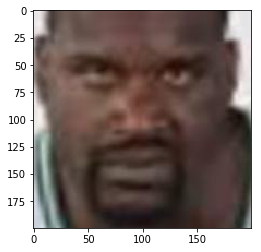

In [8]:
num = random.randint(0, len(list_path_files))
im_path = list_path_files[num]
print(im_path)
im = Image.open(im_path)
print(im.format, im.size, im.mode)
plt.imshow(np.asarray(im))


In [9]:
print(len(glob.glob(path_files)))

23708


## dataloaderを作成

pytorchの形式のデータセットのオブジェクトを定義

In [10]:
class FaceData(Dataset):
    def __init__(self, path_dir, df=None, cache=False, to_tensor=False):
        self.path_dir = path_dir 
        if df is None:
            path_files = os.path.join(path_dir, "*.jpg")
        else:
            self.df = df
            path_files =[]
            for idx in self.df.index:
                #print(os.path.join(path_dir, idx))
                path_files.append(os.path.join(path_dir, idx))
        self.list_path_files = path_files
        #print("num sample",len(self.list_path_files))
        self.cache = cache
        self.to_tensor = to_tensor
        if self.cache:
            self.data = []
            for idx in range(len(self.list_path_files)):
                self.data.append(self.__getitem__from_file(idx))

    
    def __len__(self):
        return len(self.list_path_files)
    
    def __getitem__(self, idx):
        if self.cache:
            return self.__getitem__from_list(idx)
        else:
            return self.__getitem__from_file(idx)
    
    def __getitem__from_list(self, idx):
        return self.data[idx]
    
    def __getitem__from_file(self, idx):
        im = Image.open(self.list_path_files[idx])
        im_array = np.asarray(im).transpose((2, 0, 1))/255
        filename = os.path.basename(self.list_path_files[idx])
        name = filename.split(".")[0]
        age = int(name.split("_")[0])
        gender= name.split("_")[1]
        race = name.split("_")[2]
        if self.to_tensor:
            return {"image":torch.from_numpy(im_array), "age":age, "gender":gender, "race":race}            
        else:
            return {"image":im_array, "age":age, "gender":gender, "race":race}

In [11]:
dataset_train = FaceData(path_dir= path_dir, df=df.iloc[:20000], cache=True)
dataset_val = FaceData(path_dir= path_dir, df=df.iloc[20000:], cache=True)


In [12]:
dataloader_train = DataLoader(dataset_train, batch_size=128, shuffle=False)
dataloader_val = DataLoader(dataset_val, batch_size=128, shuffle=False)

In [13]:
count = 4
for dic in dataloader_train:
    print("shape of iamges={},  age={}".format(dic["image"].shape, dic["age"]))
    
    count -= 1
    if count < 0:
        break

shape of iamges=torch.Size([128, 3, 200, 200]),  age=tensor([ 5, 28, 26, 30, 28, 18, 24, 24, 82,  7, 30,  6, 32, 82, 35, 45, 26,  8,
        37, 45, 26, 28, 35,  3, 48, 85,  7, 18, 17, 86, 21, 26, 23, 18, 61, 26,
        21,  5, 47,  1, 29, 25, 28, 28, 23, 65, 26, 22, 26, 34, 33, 39, 52, 55,
        40, 18, 26, 53, 27, 65, 62, 58, 26,  7, 37, 35,  2, 24, 26, 24, 32, 24,
        45,  3, 31, 48, 24, 40, 26, 35,  1, 37, 30,  1, 55, 11, 65, 42, 54, 51,
        26, 15, 54,  1, 49, 23, 72, 50,  1, 36, 85,  1, 75, 27, 34, 54, 23, 29,
        34, 27, 26,  1, 88, 45, 26, 53, 25, 47, 55, 41, 26, 65, 52, 28, 20, 26,
        54, 40])
shape of iamges=torch.Size([128, 3, 200, 200]),  age=tensor([ 28,  32,  70,  38,  23,  26,  33,  24,  28,  53,  36,  21,  21,  26,
        116,  46,  13,  32,  61,  41,  53,   7,   8,  45,  66,  34,  54,  30,
         10,  53,  26,  51,   7,  26,  28,  50,   1,  38,  18,  26,  30,  25,
         16,  45,  60,  20,   1,  60,   8,   5,  30,  27,  60,   9,   8,  62,
     

## モデルを構築

In [14]:
class VariationalAutoEncoder(nn.Module):
    def __init__(self, device):
        super(VariationalAutoEncoder, self).__init__()
        self.device  = device
        self.width = 11
        self.hight = 11
        self.enc2mu =  nn.Sequential(
            nn.Linear(3 *self.width* self.hight, 3 *self.width* self.hight)
        )
        self.enc2sigma =  nn.Sequential(
            nn.Linear(3 *self.width* self.hight, 3 *self.width* self.hight)
        )
        self.z2dec =  nn.Sequential(
            nn.Linear(3 *self.width* self.hight, 3 *self.width* self.hight)
        )
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=5, stride=2, padding=0),
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 64, kernel_size=5, stride=2, padding=0),
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=0),
            nn.ReLU(True),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 3, kernel_size=3, stride=2, padding=0),
            nn.ReLU(True),
            nn.BatchNorm2d(3)
        )
        
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(3, 128, kernel_size=3, stride=2, padding=0, output_padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(128),
            nn.Conv2d(128, 128, kernel_size=3, stride=1, padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(128),
            nn.ConvTranspose2d(128, 64, kernel_size=3, stride=2, padding=0, output_padding=1),
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.ConvTranspose2d(64, 64, kernel_size=5, stride=2, padding=0, output_padding=0),
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.Conv2d(64, 64, kernel_size=5, stride=1, padding=0),
            nn.ReLU(True),
            nn.BatchNorm2d(64),
            nn.ConvTranspose2d(64, 3, kernel_size=4, stride=2, padding=0, output_padding=0),
            nn.ReLU(True),
            nn.BatchNorm2d(3),
            nn.Sigmoid()
        )
    
    def encode(self, x):
        x_encd = self.encoder(x)
        #print(x_encd.size())
        x_encd = x_encd.view(-1, 3*self.width*self.hight)
        mu = self.enc2mu (x_encd)
        ln_var = self.enc2sigma(x_encd).view(-1, 3*self.width*self.hight)
        return mu, ln_var
    
    def decode(self, z):
        z = self.z2dec(z)
        #print(z.view(-1, 3, self.hight, self.width).size())
        return self.decoder(z.view(-1, 3, self.hight, self.width))
    
    def reparameterize(self, mu, ln_var):
        std = torch.exp(0.5*ln_var)
        eps = torch.randn_like(std) 
        return mu + eps * std
    
    def forward(self, x):
        mu, ln_var = self.encode(x)
        ##print(mu.size())
        z_para = self.reparameterize(mu, ln_var)
        #print("z_para shape",z_para.size())
        out = self.decode(z_para)
        return out, mu, ln_var

    
    def compress(self, x):
        return self.encode(x)

    def generate(self, z):
        return self.decode(z)
        
    


In [15]:
def loss_func(x_recon, x_true, mu, ln_var):
    BCE = F.binary_cross_entropy(x_recon.view(-1, 3*200*200), x_true.view(-1, 3*200*200), reduction='sum')

    # see Appendix B from VAE paper:
    # Kingma and Welling. Auto-Encoding Variational Bayes. ICLR, 2014
    # https://arxiv.org/abs/1312.6114
    # 0.5 * sum(1 + log(sigma^2) - mu^2 - sigma^2)
    KLD = -0.5 * torch.sum(1 + ln_var - mu.pow(2) - ln_var.exp())

    return BCE + KLD

## 学習

In [16]:
model = VariationalAutoEncoder(device=device).to(device)
criterion = loss_func
learning_rate = 1e-4
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

パラメータをリロード

In [17]:
model.load_state_dict(torch.load("VAE_model_params.pth"))
model.eval()

VariationalAutoEncoder(
  (enc2mu): Sequential(
    (0): Linear(in_features=363, out_features=363, bias=True)
  )
  (enc2sigma): Sequential(
    (0): Linear(in_features=363, out_features=363, bias=True)
  )
  (z2dec): Sequential(
    (0): Linear(in_features=363, out_features=363, bias=True)
  )
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(5, 5), stride=(2, 2))
    (1): ReLU(inplace)
    (2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): ReLU(inplace)
    (5): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (6): Conv2d(64, 64, kernel_size=(5, 5), stride=(2, 2))
    (7): ReLU(inplace)
    (8): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (9): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (10): ReLU(inplace)
    (11): BatchNorm2d(64, eps=1e-05, momentum=0.1, a

In [18]:
pytorch_total_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(pytorch_total_params)

1089534


In [19]:
# epoch数
log = {"loss":[], "loss_val":[]}
num_epoch = 30+ 100
for i_epoch in range(30, num_epoch):
    
    model.train()
    loss_running = []
    for i_batch, batch_data in enumerate(dataloader_train):
        optimizer.zero_grad()
        X_in = batch_data["image"].to(device, dtype=torch.float)
        X_out, mu ,ln_var = model(X_in)
        #print(X_in.size(), X_out.size(), mu.size())
        loss = criterion(X_out, X_in, mu, ln_var)
        loss.backward()
        optimizer.step()
        loss_running.append(float(loss))
    loss_1epoch = sum(loss_running)/len(dataloader_train)
    log["loss"].append(loss_1epoch)  
    
    model.eval()
    loss_val_running = []
    for i_batch, batch_data in enumerate(dataloader_val):
        X_in = batch_data["image"].to(device, dtype=torch.float)
        X_out, mu, var = model(X_in)
        loss_val = criterion(X_out, X_in , mu, var)
        loss_val_running.append(float(loss_val))
    loss_val_1epoch = sum(loss_val_running)/len(dataloader_val)
    log["loss_val"].append(loss_val_1epoch)
    print("epoch={}, loss={:.5}, loss val={:.5}".format(i_epoch, loss_1epoch, loss_val_1epoch))

epoch=30, loss=8.6643e+06, loss val=8.6832e+06
epoch=31, loss=8.6528e+06, loss val=8.6726e+06
epoch=32, loss=8.6436e+06, loss val=8.6628e+06
epoch=33, loss=8.6355e+06, loss val=8.6572e+06
epoch=34, loss=8.6276e+06, loss val=8.6478e+06
epoch=35, loss=8.6206e+06, loss val=8.6436e+06
epoch=36, loss=8.6146e+06, loss val=8.6396e+06
epoch=37, loss=8.6089e+06, loss val=8.6342e+06
epoch=38, loss=8.6036e+06, loss val=8.6324e+06
epoch=39, loss=8.5987e+06, loss val=8.6247e+06
epoch=40, loss=8.5943e+06, loss val=8.6241e+06
epoch=41, loss=8.5905e+06, loss val=8.6204e+06
epoch=42, loss=8.5866e+06, loss val=8.6162e+06
epoch=43, loss=8.5833e+06, loss val=8.6136e+06
epoch=44, loss=8.5827e+06, loss val=8.6099e+06
epoch=45, loss=8.578e+06, loss val=8.6082e+06
epoch=46, loss=8.5748e+06, loss val=8.6043e+06
epoch=47, loss=8.5728e+06, loss val=8.6038e+06
epoch=48, loss=8.5698e+06, loss val=8.6012e+06
epoch=49, loss=8.5675e+06, loss val=8.5989e+06
epoch=50, loss=8.5655e+06, loss val=8.5984e+06
epoch=51, loss

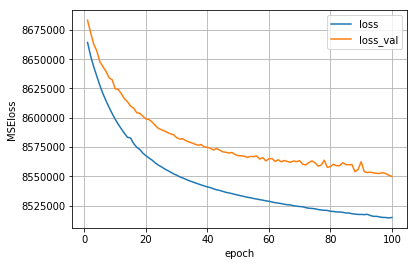

In [20]:
plt.plot(np.arange(1, len(log["loss"])+1), log["loss"], label="loss")
plt.plot(np.arange(1, len(log["loss_val"])+1), log["loss_val"], label="loss_val")
plt.xlabel("epoch")
plt.ylabel("MSEloss")
plt.grid()
plt.legend()
plt.savefig("figures_VAE/fig_vae_loss_retrain.png")
plt.show()


In [21]:
torch.save(model.state_dict(), "VAE_model_params.pth")

## 検証

In [22]:
for i_batch, batch_data in enumerate(dataloader_val):
    X_in = batch_data["image"].to(device, dtype=torch.float)
    images_in = X_in.cpu().numpy().transpose(0, 2, 3, 1)
    X_out, mu, ln_var = model(X_in)
    images_out = X_out.detach().cpu().numpy().transpose(0, 2, 3, 1)
    break

images_in = (images_in*255).astype(int)
images_out = (images_out*255).astype(int)

In [23]:
print(images_in.shape)
print(images_out.shape)

(128, 200, 200, 3)
(128, 200, 200, 3)


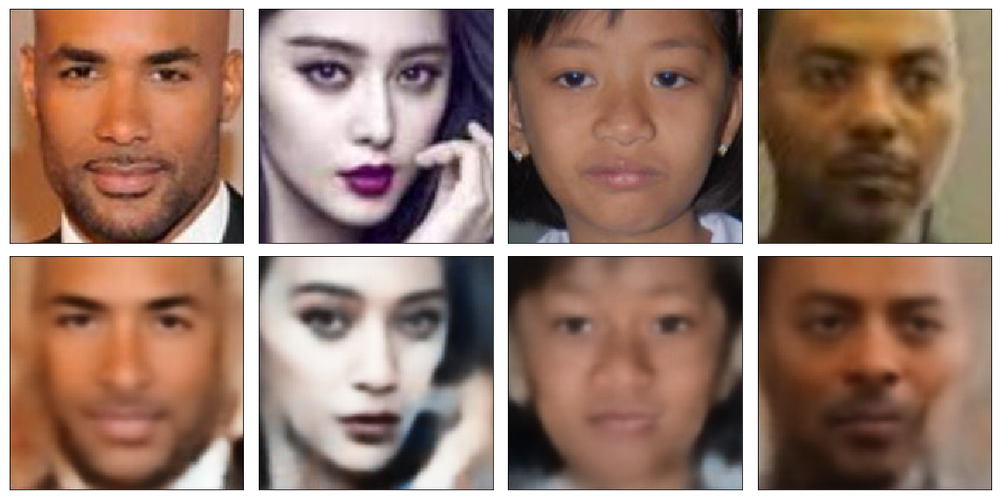

In [24]:
num_pics=4
fig, axs = plt.subplots(2, num_pics, figsize=(16, 8)) 
for ii in range(num_pics):
    
    axs[0, ii].imshow(images_in[ii])
    axs[1, ii].imshow(images_out[ii])

    for jj in range(2):
        axs[jj, ii].tick_params(labelbottom=False,
                labelleft=False,
                labelright=False,
                labeltop=False,
                bottom=False,
                left=False,
                right=False,
                top=False)
plt.tight_layout()
plt.savefig("figures_VAE/inut_output_images_VAE1_retrain.png")
plt.show()

## 顔画像を生成する

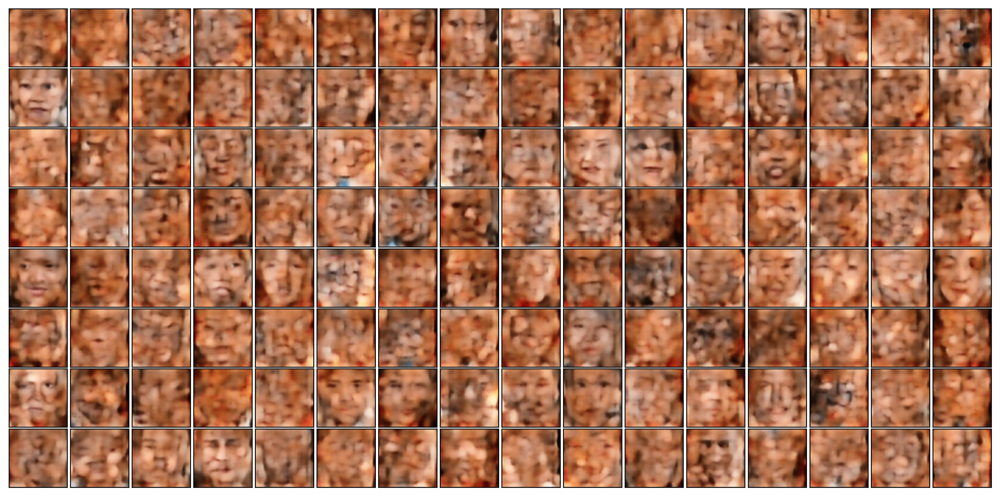

In [25]:
# 乱数を作る
randn_np = np.random.randn(128, 3*11*11) 
model.eval()
X_out = model.generate(torch.from_numpy(randn_np).to(device, dtype=torch.float))
# 画像化
images_out = X_out.detach().cpu().numpy().transpose(0, 2, 3, 1)
images_out = (images_out*255).astype(int) 
num_pics=128
w_num = 16
h_num = int(num_pics/w_num)
fig, axs = plt.subplots(h_num, w_num, figsize=(16, 8), dpi=300) 
for jj in range(h_num):
    for ii in range(w_num):
        axs[jj, ii].imshow(images_out[jj*w_num + ii])

        axs[jj, ii].tick_params(labelbottom=False,
                labelleft=False,
                labelright=False,
                labeltop=False,
                bottom=False,
                left=False,
                right=False,
                top=False)
plt.subplots_adjust(hspace=0.03, wspace=0.03)
plt.savefig("figures_VAE/generated_images_VAE_1no2_retrain.png")
plt.show()